**Atenção: Devido a natureza dos dados, para correto funcionamento, este notebook precisa ser executado em ambiente com memória RAM maior ou igual a 25 Gb.**

#**Ciência e Visualização de Dados**
##**Projeto Final - Entrega 02**
###Alunos: 
###Gleyson Roberto do Nascimento. RA: 043801. Elétrica.
###Negli René Gallardo Alvarado. RA: 234066. Saúde.
###Rafael Vinícius da Silveira. RA: 137382. Física.
###Sérgio Sevileanu. RA: 941095. Elétrica.



##Neste notebook do Google Colaboratory será realzada a análise estatística do Estado de Goiás durante os anos de 2008 a 2018 segundo o banco de dados [SIHSUS](https://bigdata-metadados.icict.fiocruz.br/dataset/sistema-de-informacoes-hospitalares-do-sus-sihsus/resource/ae85ac54-6734-43b8-a820-6129a854e1ff).

##Desta forma, algumas definições iniciais e um disclaimer se fazem necessários para este projeto:

##Será definido como **diagnóstico correto** aquele em que houve apenas um diagnóstico de CID10, sem alterações durante o período até a alta;  
##Será definido como **diagnóstico equivocado** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte do mesmo grupo, de forma que é plausível o equívoco dada a semelhança de sintomas entre os CID10;
##Será definido como **falha de diagnóstico** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte de grupos distintos, de forma que embora possam existir sintomas semelhantes entre os CID10, caberia ao profissional uma análise mais aprofundada antes do diagnóstico.
##**Disclaimer**: Considerando a natureza do banco de dados do SIHSUS, isto é, um Big Data em que inúmeros funcionários do Sistema Único de Saúde possuem acesso e inserem os dados de forma manual em realdades e condições bastante distintas, existe a séria possibildade de erro sistemático, desta forma, a acurácia deste trabalho deve ser considerada com ressalvas.

##Instalando e Importando as Bibliotecas Necessárias.

In [ ]:
!pip install dask[complete]
!pip install -U -q PyDrive

In [ ]:
%load_ext google.colab.data_table
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import dask
from dask import dataframe as dd
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from google.colab import files
from oauth2client.client import GoogleCredentials
pd.set_option('display.max_columns', None)
pd.options.display.precision = 2
pd.options.display.max_rows = 50
import seaborn as sns
import missingno as msno
import matplotlib as mpl
from matplotlib import rcParams
mpl.rc('figure', max_open_warning = 0)
import statsmodels.api as sm
from statsmodels.api import graphics
import statsmodels.formula.api as smf
import statsmodels.stats.multicomp as multi
from scipy.stats import pearsonr
from scipy.stats import spearmanr
pd.set_option('display.max_columns', None)
import itertools
import sklearn
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

##Fazendo Autenticação do Gooogle Drive, Baixando os Arquivos e Criando Dataframes.

##O dicionário de Variáveis para os arquivos se econtra no [GitHub](https://github.com/grnbatera/Data4health/blob/main/assets/Dicion%C3%A1rio%20de%20Vari%C3%A1veis.csv) 



In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
ids = ['1Hdzz218LvSzz_reDjndKZ2a6r_M_zKl-','1LcqDxhUAIwVEsMEcrfAAQGjoQvCD8qGn','19zx0YYD10ddYYGGk5BOwKcvLSlyE0DcQ','1vffaXC_qag8_dwf49xDPL7CctAxZ6_x-','16g9O_wwsowh5V6CHNRWxnpA1rQtxZX7G']
estados = ['SP','BA','PR','PA','GO']
arquivo = ['sp.pkl','ba.pkl','pr.pkl','pa.pkl','go.pkl']

In [ ]:
dflist=[]
for i in range (len(ids)):
  fileDownloaded = drive.CreateFile({'id':ids[i]})
  fileDownloaded.GetContentFile(arquivo[i])
  globals()[estados[i]] = pd.read_pickle(arquivo[i])
  globals()[estados[i]] = (globals()[estados[i]]).reset_index(drop=True)
  dflist.append(eval(estados[i]))

###Baixando arquivo com Valores Anuais de Custo por Internação e Atendimento e fazendo o merge com o arquivo principal do SIHSUS.

In [ ]:
fileDownloaded = drive.CreateFile({'id':'1corB_xGrJ3NDFpIXuKDl6Dri_tlPLzI0'})
fileDownloaded.GetContentFile('anual.xlsx')
anual = pd.read_excel('anual.xlsx',sheet_name='anual')

In [ ]:
anual['cep'] = [i[0] for i in anual.v241.str.split(' ').values]

In [ ]:
anual['cep']=anual['cep'].astype('int64')
anual.columns = ['v1',	'v241',	'v242',	'v243',	'v244',	'v245',	'v246',	'v247',	'v248',	'v249',	'v250',	'v251',	'v252','v0']

In [ ]:
full = pd.merge(GO,anual, on=['v0','v1'],how='left')

In [ ]:
full

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
0,520000,2008,12,3,NaN,5208104784180,AIH Campanha de Cirurgias Eletivas,5208104784180,1,Normal,75570000,520350,52,19690722,3,Feminino,0,0,0,0,Não utilizou UTI,0,0,2,303140046,303140046,453.48,25.71,479.19,0.0,207.44,20081203,20081205,J459,NaN,12,Alta melhorado,50,NaN,NaN,2,Estadual plena,0,Não,520350,52,4,Anos,39,2,2,0,Sem óbito,10,2,2,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,0,0,3354423,1.15e+12,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),0,Sem regra contratual,1,Branca,NaN,8957,HE52000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,520350,Bom Jesus de Goiás,BOM JESUS DE GOIAS,N,N,N,52,5205,5216,52900,-18.21,-49.74,619.0,1405.22,520350,520350,Bom Jesus de Goiás,BOM JESUS DE GOIAS,N,N,N,52,5205,5216,52900,-18.21,-49.74,619,1405.22,520350,GO,52,GOIAS,GO,GOIAS,Região Centro-Oeste,Região Centro-Oeste,Goiás,GO,Goiás,GO,Bom Jesus de Goiás,Bom Jesus de Goiás,NaN,NaN,Sul,Sul,NaN,NaN,Sul GO,Sul GO,Meia Ponte,Sul,Sul,Região não definida - GO,Região não definida - GO,NaN,Brasil,Não Informado,Clínico,TRATAMENTO DAS DOENCAS CRONICAS DAS VIAS AEREA...,TRATAMENTO DAS DOENCAS CRONICAS DAS VIAS AEREA...,39,15-49a,35-44a,35-39a,Capítulo X - Doenças do aparelho respiratório,Doenças crônicas das vias aéreas inferiores,Asma,Asma não especificada,NaN,NaN,NaN,NaN,2008,qua,2008,sex,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,520000,2008,12,1,2.34e+12,5208104882112,AIH Campanha de Cirurgias Eletivas,5208104882112,1,Normal,75690000,520450,52,19780220,3,Feminino,0,0,0,0,Não utilizou UTI,0,0,1,407020284,407020284,191.10,124.84,315.94,0.0,136.77,20081128,20081129,I843,NaN,12,Alta melhorado,20,NaN,NaN,2,Estadual plena,0,Não,521380,52,4,Anos,30,1,1,0,Sem óbito,10,2,2,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,0,0,2443031,NaN,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),0,Sem regra contratual,99,NaN,NaN,8505,HE52000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,520450,Caldas Novas,CALDAS NOVAS,N,N,N,52,5205,5215,52900,-17.74,-48.63,686.0,1589.52,520450,521380,Morrinhos,MORRINHOS,N,N,N,52,5205,5216,52900,-17.73,-49.10,771,2846.19,521380,GO,52,GOIAS,GO,GOIAS,Região Centro-Oeste,Região Centro-Oeste,Goiás,GO,Goiás,GO,Morrinhos,Caldas Novas,NaN,NaN,Sul,Estrada de Ferro,NaN,NaN,Sul GO,Sul GO,Meia Ponte,Sul,Estrada de Ferro,Região não definida - GO,Região não definida - GO,NaN,Brasil,Não Informado,Cirúrgico,HEMORROIDECTOMIA,HEMORROIDECTOMIA,30,15-49a,25-34a,30-34a,Capítulo IX - Doenças do aparelho circulatório,"Doenças das veias, dos vasos linfáticos e dos ...",Hemorróidas,Hemorróidas externas trombosadas,NaN,NaN,NaN,NaN,2008,sex,2008,sab,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,520000,2008,12,1,2.34e+12,5208104882123,AIH Campanha de Cirurgias Eletivas,5208104882123,1,Normal,75650000,521380,52,19890216,3,Feminino,0,0,0,0,Não utilizou UTI,0,0,1,407030026,407030026,471.16,248.61,719.77,0.0,311.58,20081128,20081129,K801,NaN,12,Alta melhorado,20,NaN,NaN,2,Estadual plena

###Fazendo o download do arquivo intermediário 1 em pickle para evitar retrabalho caso o Colab dê problema de RAM. 

In [ ]:
with open('full.pkl','wb') as f:
  pickle.dump(full,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('full.pkl')

##Fazendo o tratamento do banco.

###Fazendo uma análise das variáveis para verificar se são numéricas ou categóricas, verificar o tipo e a quantidade de itens únicos por variável.

In [ ]:
draw={}
categoricon = []
categoricost = []
notcategorical = []
k=4
print('\033[1m'+'Valores únicos de '+ estados[k]+'\033[0m')
for col in full:
  draw[col] = full[col].unique()
  print('Variavel: ',col,' | Tipo da Variável: ',full[col].dtypes,' | Quantidade de itens: ',len(draw[col]))
  if full[col].dtypes != 'object' and len(draw[col]) < 5000:
    categoricon.append(col)
  elif full[col].dtypes != 'object' and len(draw[col]) > 5000:
    notcategorical.append(col)
  else:
    categoricost.append(col)    
print('\n')

Valores únicos de GO
Variavel:  v0  | Tipo da Variável:  int64  | Quantidade de itens:  181
Variavel:  v1  | Tipo da Variável:  int64  | Quantidade de itens:  11
Variavel:  v2  | Tipo da Variável:  int64  | Quantidade de itens:  1
Variavel:  v3  | Tipo da Variável:  int64  | Quantidade de itens:  12
Variavel:  v4  | Tipo da Variável:  float64  | Quantidade de itens:  186
Variavel:  v5  | Tipo da Variável:  int64  | Quantidade de itens:  307667
Variavel:  v6  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v7  | Tipo da Variável:  int64  | Quantidade de itens:  307667
Variavel:  v8  | Tipo da Variável:  int64  | Quantidade de itens:  2
Variavel:  v9  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v10  | Tipo da Variável:  int64  | Quantidade de itens:  25156
Variavel:  v11  | Tipo da Variável:  int64  | Quantidade de itens:  890
Variavel:  v12  | Tipo da Variável:  int64  | Quantidade de itens:  27
Variavel:  v13  | Tipo da Variável:  int64  | Quanti

###Substituindo valores de Missing para tratamento de categorias.

In [ ]:
full[categoricon] = (full[categoricon]).fillna(99999)
full[categoricost] = (full[categoricost]).fillna('a99999')
full[notcategorical] = (full[notcategorical]).fillna('a99999')
full[['v248','v250','v251','v252']]=full[['v248','v250','v251','v252']].replace('a99999',9.99999)
full[['v243','v249']]=full[['v243','v249']].replace('a99999',99999)

In [ ]:
full2=full.copy()

###Criando categorias numéricas para as variáveis do tipo string.

In [ ]:
for i in range(len(categoricost)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricost[i]])
  full2[categoricost[i]]=le.transform(full2[categoricost[i]])
  print('As categorias de', categoricost[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricost[i]].unique()))

As categorias de v6 eram: ['9' 'AIH Campanha de Cirurgias Eletivas'] e mudaram para: [0, 1]
As categorias de v9 eram: ['Longa permanência' 'Normal'] e mudaram para: [0, 1]
As categorias de v15 eram: ['Feminino' 'Masculino'] e mudaram para: [0, 1]
As categorias de v23 eram: ['Não utilizou UTI' 'UTI Doador' 'UTI adulto - tipo I'
 'UTI adulto - tipo II' 'UTI coronariana tipo II - UCO tipo II'
 'UTI de queimados' 'UTI infantil - tipo I' 'UTI infantil - tipo II'
 'UTI neonatal - tipo I' 'UTI neonatal - tipo II'
 'Utilizou mais de um tipo de UTI'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
As categorias de v48 eram: ['A000' 'A001' 'A009' ... 'Z948' 'Z949' 'Z988'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79,

###Criando categorias numéricas para as variáveis do tipo numérico.

In [ ]:
for i in range(len(categoricon)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricon[i]])
  full2[categoricon[i]]=le.transform(full2[categoricon[i]])
  print('As categorias de', categoricon[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricon[i]].unique()))

As categorias de v0 eram: [520000 520013 520025 520030 520050 520060 520080 520085 520090 520110
 520130 520140 520150 520160 520170 520180 520215 520235 520250 520280
 520320 520330 520340 520350 520355 520380 520390 520393 520400 520410
 520425 520430 520440 520450 520465 520470 520480 520490 520495 520500
 520505 520510 520520 520530 520540 520545 520547 520549 520551 520552
 520570 520580 520590 520620 520630 520640 520650 520660 520670 520680
 520710 520725 520740 520750 520753 520760 520780 520790 520800 520810
 520830 520840 520850 520860 520870 520880 520890 520910 520960 520970
 520980 520990 520993 520995 521000 521010 521020 521030 521040 521060
 521080 521090 521100 521120 521130 521140 521150 521160 521170 521180
 521190 521200 521210 521220 521230 521250 521260 521270 521280 521290
 521295 521300 521308 521310 521350 521370 521375 521380 521385 521390
 521400 521405 521410 521440 521450 521460 521483 521500 521520 521530
 521550 521560 521565 521570 521580 521590 521630 5

###Criando categorias numéricas para as variáveis com grande número de valores únicos.

In [ ]:
for i in range(len(notcategorical)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[notcategorical[i]])
  full2[notcategorical[i]]=le.transform(full2[notcategorical[i]])
  print('As categorias de', notcategorical[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[notcategorical[i]].unique()))

###Salvando este arquivo como final.

In [ ]:
with open('full2.pkl','wb') as f:
  pickle.dump(full2,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
files.download('full2.pkl')

###Fazendo a análise estatística para o arquivo final.

In [ ]:
full2.describe()

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
count,310743.00,310743.00,310743.0,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.0,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,3.11e+05,310743.00,310743.0,310743.0,310743.0,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,3.11e+05,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.0,310743.00,310743.0,310743.00,310743.00,310743.0,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.0,310743.00,310743.0,310743.0,310743.0,310743.00,310743.0,310743.0,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.0,310743.00,310743.00,310743.00,310743.0,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.0,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.00,310743.0
mean,69.73,4.90,0.0,1.69,43.59,152767.03,1.00,152767.03,0.03,0.97,16069.26,729.78,24.91,19614.92,0.56,0.44,0.39,0.39,0.39,0.22,0.24,0.02,1.14,4.64,412.70,410.34,13275.26,2889.68,14851.87,4.89,17575.81,1142.46,867.14,2479.24,635.22,4.60,8.20,2.49,10.15,9.20,0.07,0.93,0.11,0.11,77.01,0.0,1.95,1.06,39.79,4.99,4.99,0.03,0.97,0.01,0.86,0.86,0.05,0.95,0.02,7.96,0.02,9.99,0.07,0.05,1.00,1.00,185.84,1.35e-03,6.00,0.0,0.0,0.0,8.91,0.13,14.36,149.30,53.97,142.47,467.69,0.05,0.95,0.94,0.94,0.14,2.80,3.10,3.56,1.54,3515.38,581.80,106.28,109.21,35.27,16.88,39.10,1.87,1.87,752.79,2.04,1.92,1.95,1.95,1.30,0.65,0.65,0.65,0.65,0.65,729.78,356.13,357.51,0.02,9.30e-04,0.24,24.91,56.86,219.29,88.65,314.71,362.39,401.11,404.04,729.77,77.01,77.79,77.03,0.01,0.0,0.40,0.0,0.95,4.44,0.0,74.12,100.70,103.16,86.86,77.01,8.05,0.0,8.05,0.0,0.0,0.0,0.01,0.0,0.0,8.05,8.05,77.79,356.67,1.39,33.15,4.77,135.49,1.41,33.20,0.91,41.51,123.47,4.77,110.77,0.0,91.03,4.47,9.01,0.0,2.17,936.91,957.84,39.62,1.82,3.85,7.85,9.34,122.77,656.50,2295.58,20.86,139.40,402.8,741.07,6.87,3.22,4.90,3.06,39.79,81.96,892.50,893.70,1327.87,1334.44,136

###Fazendo o cálculo da Correlação e P-Valor das Variáveis.

In [ ]:
def pvalor(df,metodo):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    if metodo == 'spearman':
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = spearmanr(df[r], df[c])[1]
    else:
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = pearsonr(df[r], df[c])[1]
    return pvalues

In [ ]:
cid_columns = ['v48','v49','v82','v104','v105']

In [ ]:
metodo = ['pearson','spearman']

In [ ]:
correlacao = []
p_valor = []
for i in range(len(metodo)):
  #Calculando as correlações por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'Coeficientes de Correlação por '+ metodo[i] + '\033[0m')
  print('\n')
  k1 = full2.corr(method=metodo[i])
  correlacao.append(k1)
  print(correlacao[i])
  print('\n')

  #Calculando o p-valor por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'P-valor por '+ metodo[i] + '\033[0m')
  print('\n')
  k2 = pvalor(full2,metodo[i])
  p_valor.append(k2)
  print(p_valor[i])
  print('\n')

Coeficientes de Correlação por pearson


        v0        v1  v2        v3    v4    v5        v6    v7    v8    v9  \
v0    1.00  8.05e-02 NaN -1.93e-02  0.07  0.12 -2.14e-03  0.12 -0.12  0.12   
v1    0.08  1.00e+00 NaN -1.02e-01 -0.09  0.98  1.20e-02  0.98 -0.03  0.03   
v2     NaN       NaN NaN       NaN   NaN   NaN       NaN   NaN   NaN   NaN   
v3   -0.02 -1.02e-01 NaN  1.00e+00 -0.03 -0.12  3.28e-02 -0.12  0.22 -0.22   
v4    0.07 -9.12e-02 NaN -3.48e-02  1.00 -0.08  1.02e-03 -0.08 -0.02  0.02   
...    ...       ...  ..       ...   ...   ...       ...   ...   ...   ...   
v248  0.14  1.60e-01 NaN -1.06e-01  0.18  0.15 -1.95e-02  0.15 -0.06  0.06   
v249 -0.26 -9.61e-02 NaN -5.59e-02  0.21 -0.13 -1.81e-02 -0.13  0.08 -0.08   
v250 -0.52 -2.14e-01 NaN  1.57e-02  0.07 -0.26 -1.22e-02 -0.26  0.17 -0.17   
v251 -0.38 -1.62e-03 NaN -3.27e-02  0.06 -0.05 -2.17e-02 -0.05  0.10 -0.10   
v252 -0.34  7.50e-02 NaN  9.50e-04 -0.04  0.03 -7.07e-03  0.03  0.10 -0.10   

           v10       v

###Fazendo o heatmap de Corrrelação para as variáves com CID10 definido.

In [ ]:
def corr_to_target(dataframe, target, title=None, file=None):
  plt.figure(figsize=(10,60))
  sns.set(font_scale=1)
  sns.heatmap(dataframe.corr(method = 'spearman')[[target]].sort_values(target,ascending=False)[1:],annot=True,cmap='coolwarm')
  if title: plt.title(f'\n{title}\n', fontsize=18)
  #plt.xlabel('') — # optional in case you want an x-axis Label
  #plt.ylabel('') # optional in case you want a y-axis Label
  if file: plt.savefig(file,bbox_inches='tight', format='png',dpi=600)
  plt.show();
  return

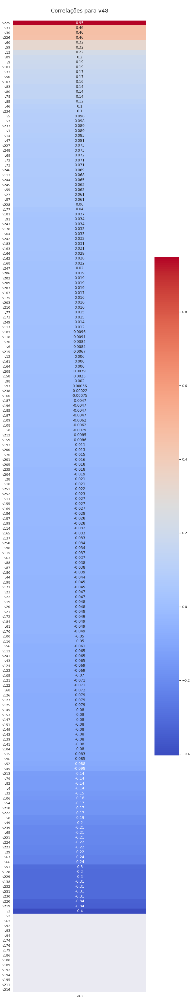

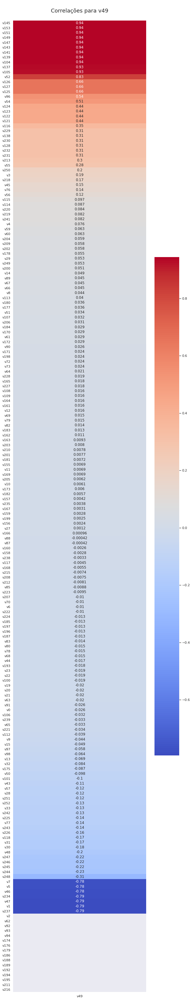

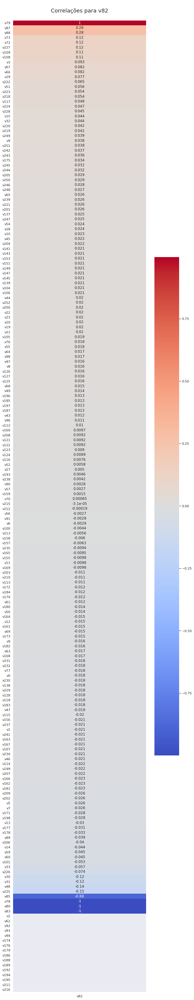

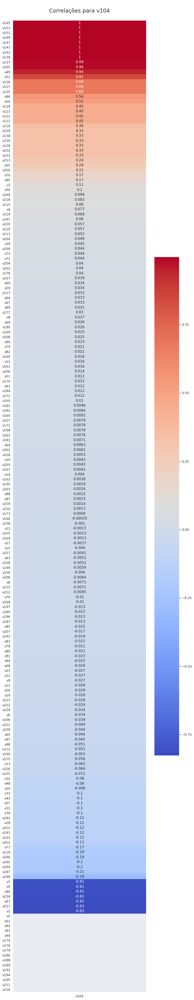

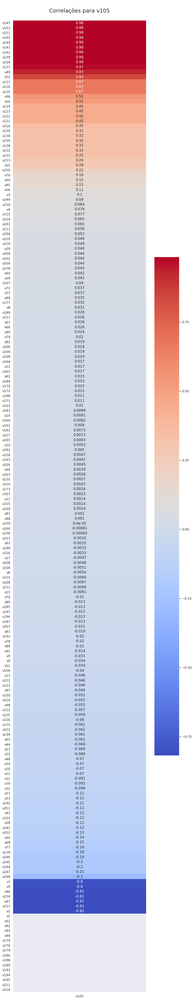

In [ ]:
for col in cid_columns:
  corr_to_target(full2,col,title = 'Correlações para '+ col, file='/content/drive/MyDrive/zica/correlacaogo'+col+'.png')

###Criando uma matriz com um string correspondente ao match de correlação e p-valor.

In [ ]:
def classecat(num):
  if abs(num) >= 0.7:
    return 'Correlação Forte'
  elif 0.5 <= abs(num) < 0.7:
    return 'Correlação Moderada'
  elif 0.3 <= abs(num) < 0.5:
    return 'Correlação Fraca'
  else:
    return 'Não há Correlação'

In [ ]:
def classepval(num):
  if abs(num) < 0.001:
    return 'Certeza Alta'
  elif 0.01 <= abs(num) < 0.05:
    return 'Certeza Moderada'
  elif 0.05 <= abs(num) < 0.1:
    return 'Certeza Fraca'
  else:
    return 'Nível de Certeza Ináceitável'

In [ ]:
relacoes = correlacao.copy()
for i in range(len(relacoes)):
  for col in relacoes[i]:
    (relacoes[i])[col] = (relacoes[i])[col].map(classecat)+ ' e '+ (p_valor[i])[col].map(classepval)

In [ ]:
relacoes[0]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Não há Correlação e Certeza Moderada,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Correlação Fraca e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certez

In [ ]:
relacoes[1]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moderada e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Correlação Fraca e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Moderada,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Al

###Salvando a matriz de correlações em pickle.

In [ ]:
with open('relacoes.pkl','wb') as f:
  pickle.dump(relacoes,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('relacoes.pkl')

###Fazendo o scatterplot das variáveis de CID10 com as demais variáveis do banco para análise gráfica de correlação.

In [ ]:
z=sorted(np.unique(['v225','v151','v147','v143','v139','v137','v125','v7','v46','v237','v79','v78','v83','v153','v149','v145','v141','v105','v49','v127','v125','v5','v46','v47','v237','v153','v149','v145','v141','v104','v49','v127','v125','v46','v47','v1','v5']))

In [ ]:
x_vars = z
y_vars=cid_columns

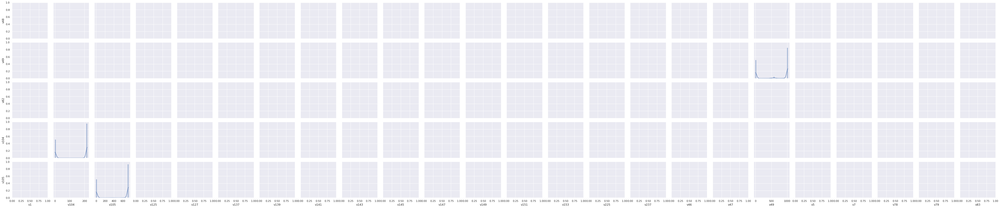

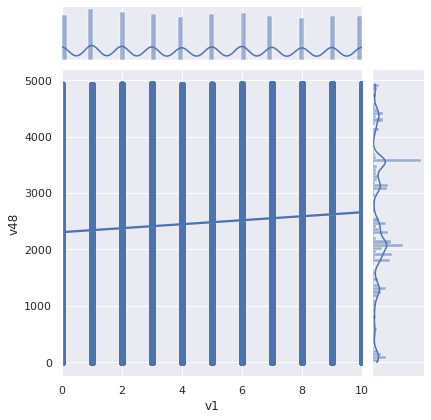

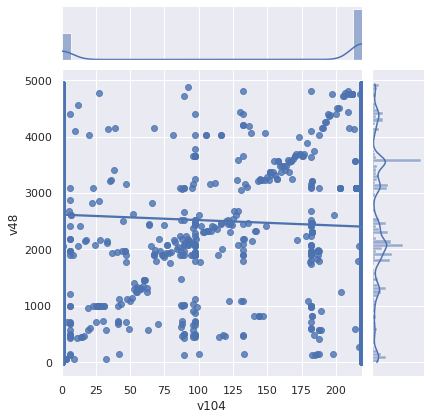

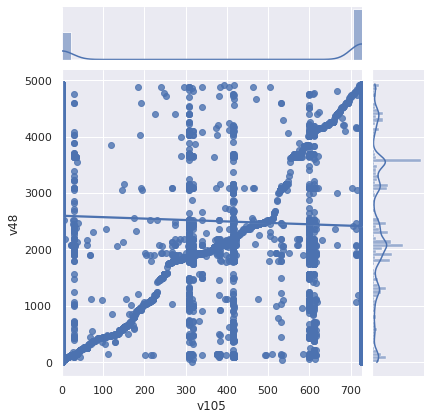

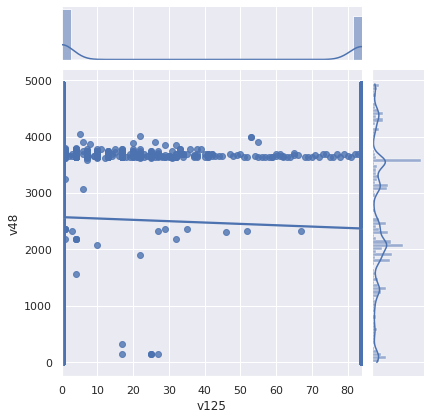

...

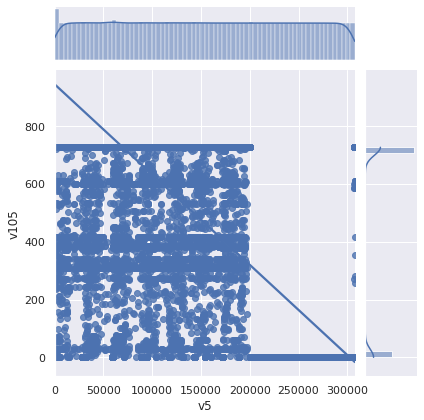

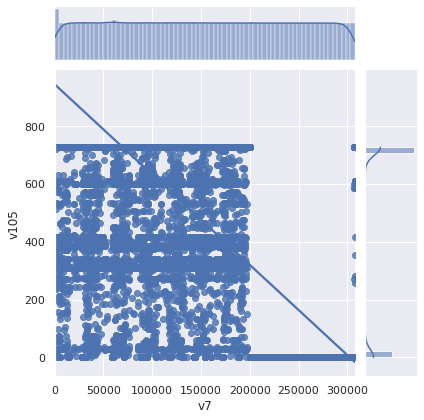

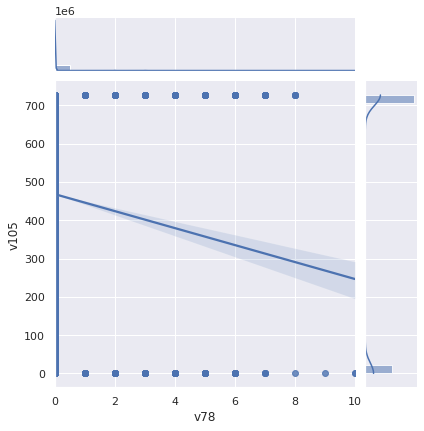

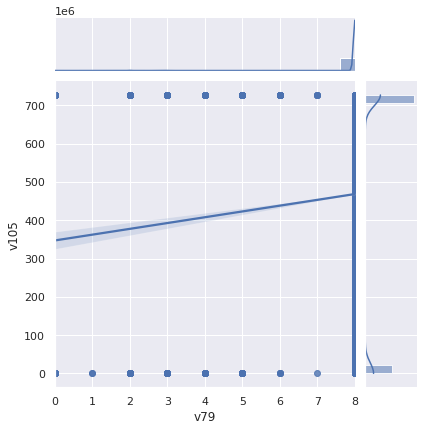

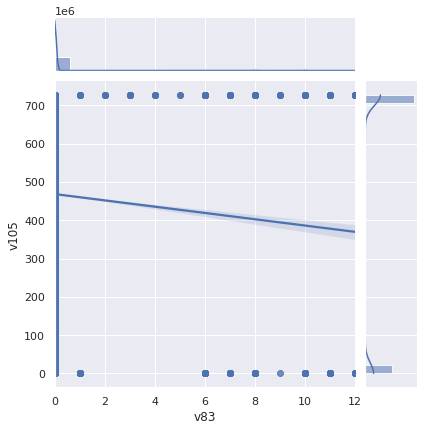

In [ ]:
plt.ioff()
g = sns.PairGrid(full2,x_vars = x_vars, y_vars=y_vars, palette='rocket')
g.map_diag(sns.histplot, kde=True)
g.map_offdiag(sns.jointplot, kind='reg')
#plt.savefig('/content/drive/MyDrive/zica/pairplotgo01'+x_vars+y_vars+'.png',format = 'png',dpi=600)
plt.show();

###Fazendo o Q-Q Plot das Variáveis do Banco.



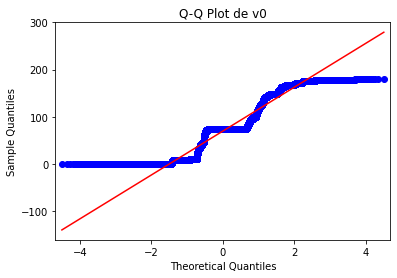

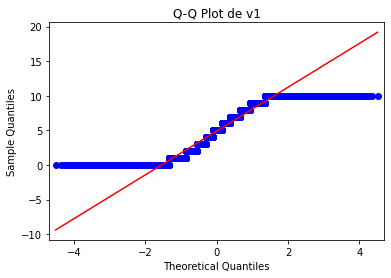

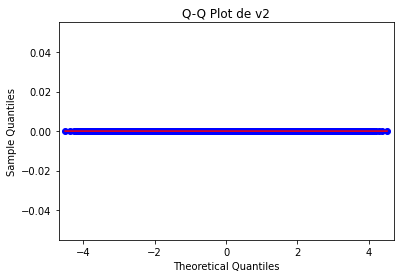

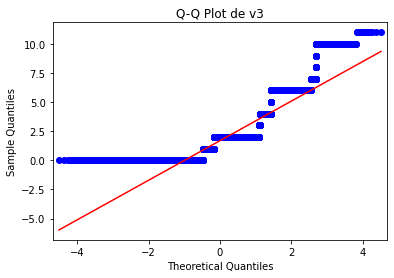

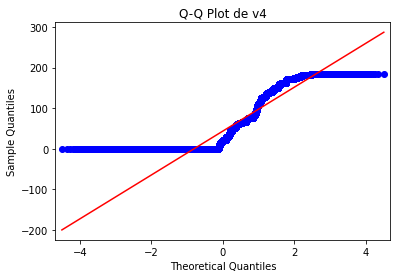

...

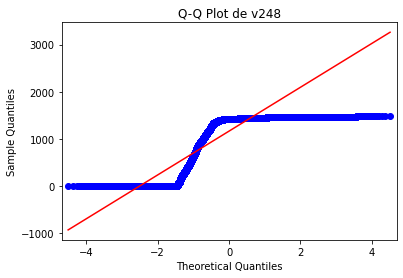

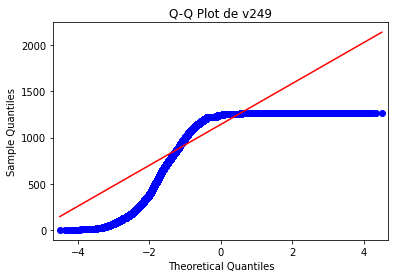

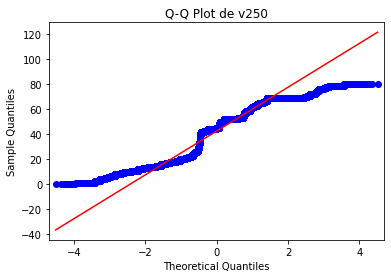

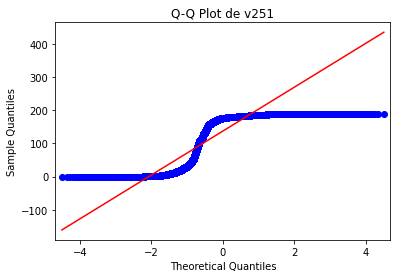

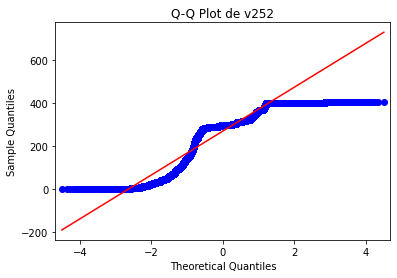

In [ ]:
plt.ioff()
for col in full2.columns:
  sm.qqplot(full2[col], line='s')
  plt.title('Q-Q Plot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();

###Fazendo o Box Plot das Variáveis.

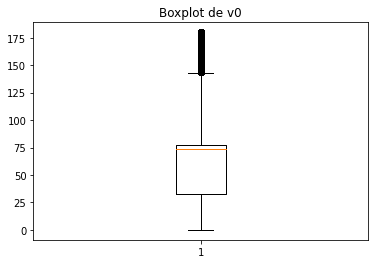

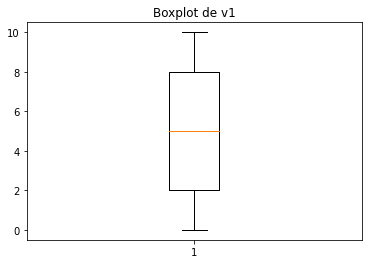

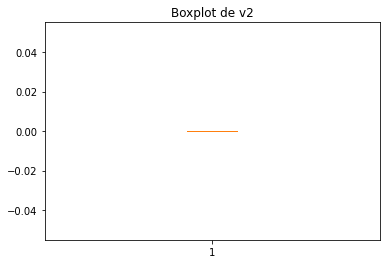

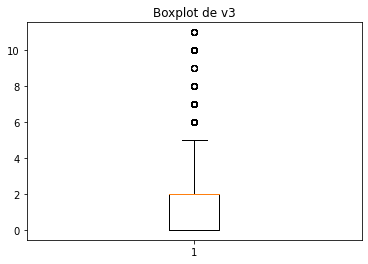

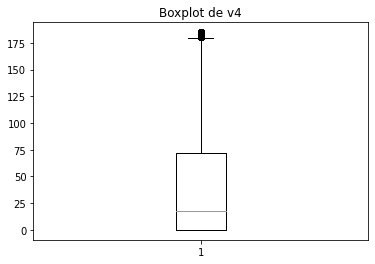

...

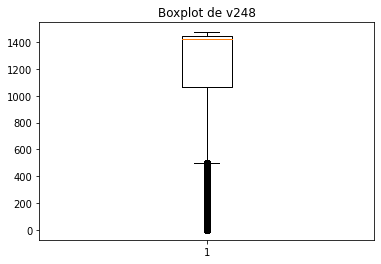

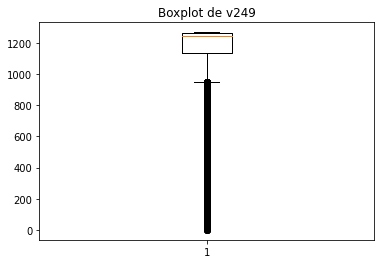

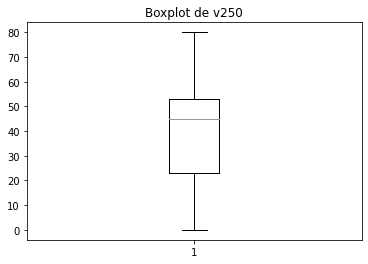

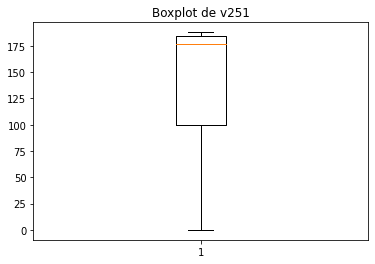

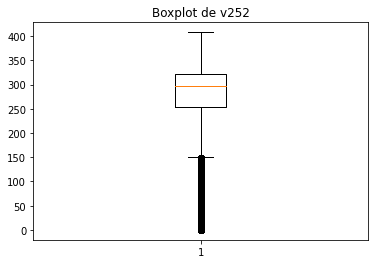

In [ ]:
plt.ioff()
for col in full2.columns:
  plt.boxplot(full2[col])
  plt.title('Boxplot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();